In [2]:
import pandas as pd
data = pd.read_csv('CC GENERAL.csv')
data = data.drop('CUST_ID',axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

In [3]:
data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
data.isnull().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [16]:
data.loc[0]

BALANCE                               40.900749
BALANCE_FREQUENCY                      0.818182
PURCHASES                             95.400000
ONEOFF_PURCHASES                       0.000000
INSTALLMENTS_PURCHASES                95.400000
CASH_ADVANCE                           0.000000
PURCHASES_FREQUENCY                    0.166667
ONEOFF_PURCHASES_FREQUENCY             0.000000
PURCHASES_INSTALLMENTS_FREQUENCY       0.083333
CASH_ADVANCE_FREQUENCY                 0.000000
CASH_ADVANCE_TRX                       0.000000
PURCHASES_TRX                          2.000000
CREDIT_LIMIT                        1000.000000
PAYMENTS                             201.802084
MINIMUM_PAYMENTS                     139.509787
PRC_FULL_PAYMENT                       0.000000
TENURE                                12.000000
Name: 0, dtype: float64

In [5]:
data['CREDIT_LIMIT'].fillna(data["CREDIT_LIMIT"].median(),inplace=True)
data["MINIMUM_PAYMENTS"].fillna(data['MINIMUM_PAYMENTS'].median(),inplace=True)

In [36]:
from sklearn.preprocessing import StandardScaler
data_scaled = StandardScaler().fit_transform(data.values)

data_scaled = pd.DataFrame(data_scaled, columns=data.columns)


In [37]:
from sklearn.cluster import AgglomerativeClustering

model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='complete')
clust_labels=model.fit_predict(data_scaled)
agglomerative=pd.DataFrame(clust_labels)


<ipython-input-38-d46be8076aa1>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig =plt.figure()


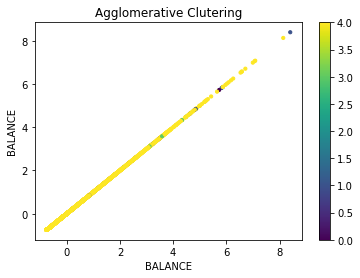

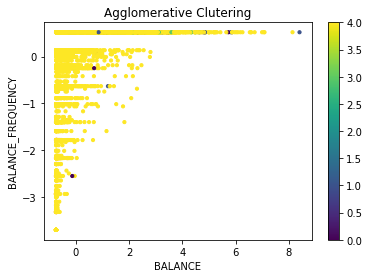

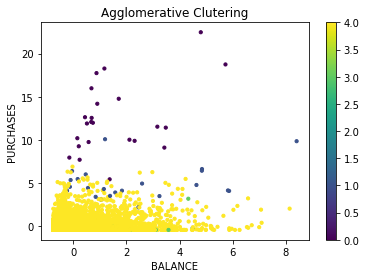

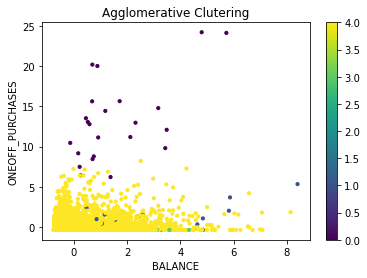

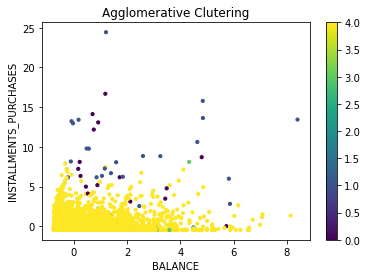

...

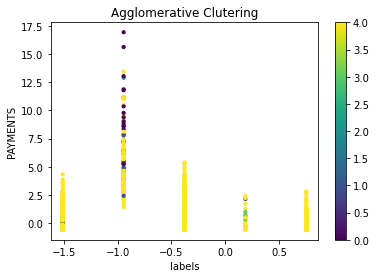

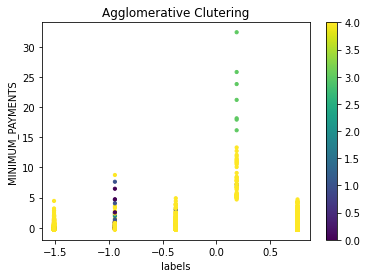

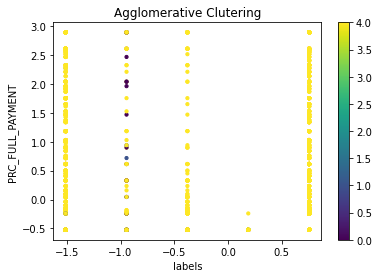

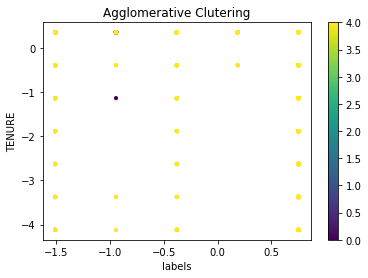

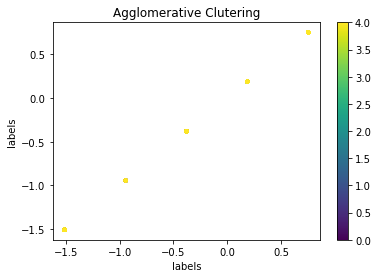

In [38]:
import matplotlib.pyplot as plt
def aggl_clustering(a,b):
    fig =plt.figure()
    ax = fig.add_subplot(111)
   
    scatter = ax.scatter (data_scaled [a] , data_scaled [b] , c= agglomerative[0], s=10)
    ax.set_title("Agglomerative Clutering")
    ax.set_xlabel(a)
    ax.set_ylabel(b)
    plt.colorbar(scatter)

index=data_scaled.columns
for i in index:
    for j in index:
        aggl_clustering(i,j)

In [27]:
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))
plt.title("Customer Dendrograms")
dend=shc.dendrogram(shc.linkage(data, method="complete"))

Error in callback <function flush_figures at 0x0000023BC40F9EE0> (for post_execute):


KeyboardInterrupt: 

In [49]:
from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans=KMeans(n_clusters=3, random_state=0)  #Cluster our data by choosing 5 as number of clusters
kmeans.fit(data_scaled)

KMeans(n_clusters=3, random_state=0)

In [50]:
labels=pd.DataFrame(kmeans.labels_)
data_scaled['labels']=labels

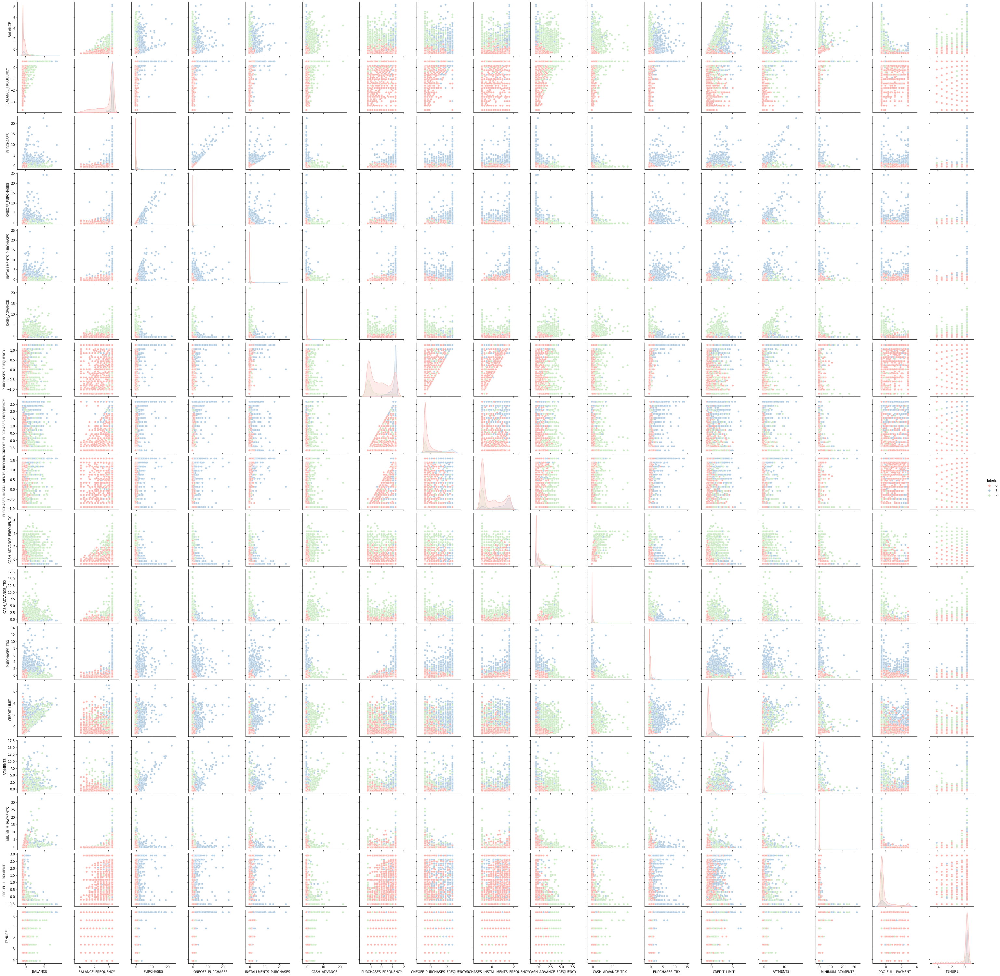

In [51]:
import seaborn as sns
sns.pairplot(data_scaled, hue='labels', palette="Pastel1")

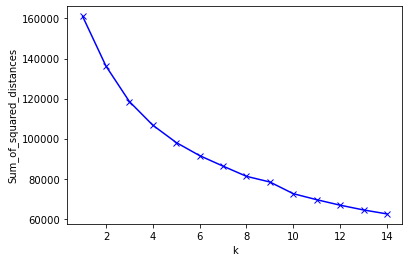

In [45]:
Sum_of_squared_distances=[]
K = range(1,15)
for k in K:
    km=KMeans(n_clusters=k)
    km=km.fit(data_scaled)
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.show()

[161100.00000000032, 136206.8943440027, 118512.33178519808, 106709.46563330364, 98156.49531340534, 91528.3625074091, 86280.10593084311, 81260.33714139891, 77175.85521513222, 74322.67903392187, 69538.27515111837, 66780.3051325372, 64409.13679440807, 62452.50188056226]
